In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
from scipy.sparse import csr_matrix
import anndata as ad
from datetime import datetime
import matplotlib.pyplot as plt

import os
%env CUDA_VISIBLE_DEVICES=0
import torch
print("cuda available: " + str(torch.cuda.is_available()))


env: CUDA_VISIBLE_DEVICES=0
cuda available: True


In [2]:
adata = sc.read("/localdata/rna_rep_learning/sadefeldman/sadefeldman_adata.h5ad")

In [3]:
import scipy.stats
np.random.seed(0)

# Bootstrap to create semi-synthetic dataset with 600 samples

## Sample patients and ncells

### draw the n cells per synthetic sample from a Poisson fitted to our smaples

In [4]:
ncells = adata.obs.groupby("pid").size()

In [5]:
fitted_ncells_poiss = scipy.stats.fit(scipy.stats.poisson, np.array(ncells), bounds={'mu':[ncells.min(), ncells.max()]})

In [6]:
syn_ncells = scipy.stats.poisson.rvs(fitted_ncells_poiss.params.mu, size=600)

### sample 600 patients uniformly at random

In [7]:
pids = pd.Series(np.random.choice(adata.obs.pid.drop_duplicates(), size=600))

## For each synthetic patient, sample 'ncells' cells from the original patient, adding normal noise to lognorm data

### what std should we use for the gaussian noise?

In [8]:
#group by pid, and cluster, and then compute std in log space

#get data in log space
logdata = adata.layers['lognorm'].copy()
logdata.data = np.log(np.expm1(adata.layers['lognorm'].data))

#randomly sample 10k cells to estimate std so that this doesnt crash
inds = np.random.choice(logdata.shape[0], 10000)
logdata = logdata[inds].todense()
logdata = pd.DataFrame(logdata, index = adata.obs.index[inds], columns = adata.var.index).merge(adata[inds].obs[["pid", "leiden"]], left_index=True, right_index=True).melt(id_vars=["pid","leiden"])

In [9]:
logdata

,pid,leiden,variable,value
0,Post_P10,1,TSPAN6,0.0
1,Post_P1,3,TSPAN6,0.0
2,Pre_P25,0,TSPAN6,0.0
3,Pre_P26,17,TSPAN6,0.0
4,Pre_P2,4,TSPAN6,0.0
...,...,...,...,...
291227883,Pre_P24,1,AC005358.1,0.0
291227884,Pre_P24,1,AC005358.1,0.0
291227885,Pre_P24,1,AC005358.1,0.0
291227886,Pre_P24,1,AC005358.1,0.0


In [13]:
#only consider non-zero values, or else the zeros dominate and the median is 0 (and also because the 0s have not been transformed to log space, and can't be)
stds = logdata[logdata!=0].groupby(["pid","leiden","variable"]).std()

In [14]:
stds

value
pid     leiden variable           
Post_P1 0      A1BG            NaN
               A1CF            NaN
               A2M             NaN
               A2ML1           NaN
               A4GALT          NaN
...                            ...
Pre_P35 23     ZYX             NaN
               ZZEF1           NaN
               ZZZ3            NaN
               hsa-mir-1199    NaN
               hsa-mir-150     NaN

[20892672 rows x 1 columns]

In [15]:
print(stds.min())
print(stds.mean())
print(stds.median())

value    0.0
dtype: float64
value    0.28111
dtype: float64
value    0.152107
dtype: float64


In [16]:
#going to use median for std for sampling gaussian noise
estimated_std = stds.median().item()

### inspect synthetic data for one patient, before creating all

In [26]:
i=0
this_pid_lognorm = adata[adata.obs.pid == pids[i]].layers['lognorm']

sampled_cell_idxs = np.random.choice(this_pid_lognorm.shape[0], size=syn_ncells[i])
sampled_data = this_pid_lognorm[sampled_cell_idxs,:]

#going to add gaussian noise in log space. 
#convert from logp1 to log, so that we have negative values before adding gaussian noise
#limite to nnz entries or log throws error
sampled_data.data = np.expm1(sampled_data.data)
sampled_data.data = np.log(sampled_data.data)

syn_data = sampled_data.copy() #at this point, syn and sampled data both log scale (without +1)
syn_data.data = sampled_data.data + np.random.normal(size=sampled_data.data.shape, scale=estimated_std)

"""plt.hist(sampled_data.todense(), alpha=0.5, label='sampled data for {}'.format(pids[i]))
plt.hist(syn_data.todense(), alpha=0.5, label='synthetic data for {}'.format(pids[i]))
plt.legend()
plt.title("log scale data")
plt.show()
"""
#convert back from log space to logp1 space
syn_data.data = np.exp(syn_data.data)
syn_data.data = np.log(syn_data.data+1)

sampled_data.data = np.exp(sampled_data.data)
sampled_data.data = np.log(sampled_data.data+1)
"""plt.hist(sampled_data.todense(), alpha=0.5, label='sampled data for {}'.format(pids[i]))
plt.hist(syn_data.todense(), alpha=0.5, label='synthetic data for {}'.format(pids[i]))
plt.legend()#['sampled data for {}'.format(pids[i]), 'synthetic data for {}'.format(pids[i])])
plt.title("logp1 data")
plt.show()"""

'plt.hist(sampled_data.todense(), alpha=0.5, label=\'sampled data for {}\'.format(pids[i]))\nplt.hist(syn_data.todense(), alpha=0.5, label=\'synthetic data for {}\'.format(pids[i]))\nplt.legend()#[\'sampled data for {}\'.format(pids[i]), \'synthetic data for {}\'.format(pids[i])])\nplt.title("logp1 data")\nplt.show()'

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.1521, log scale')

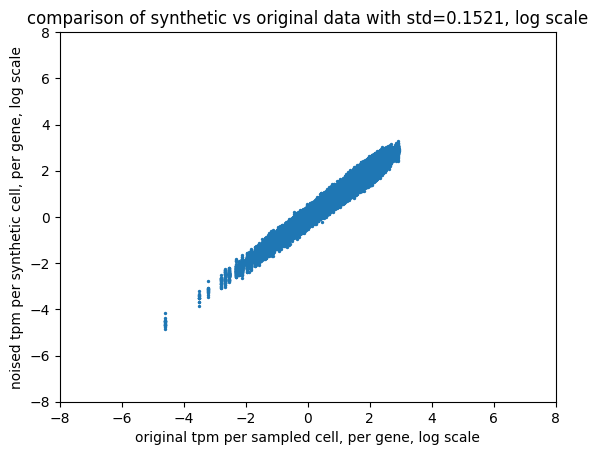

In [27]:
plt.scatter(np.log(np.expm1(sampled_data.data)), np.log(np.expm1(syn_data.data)), s=2)
plt.xlabel("original tpm per sampled cell, per gene, log scale")
plt.ylabel("noised tpm per synthetic cell, per gene, log scale")
plt.xlim(-8,8)
plt.ylim(-8,8)
plt.title("comparison of synthetic vs original data with std={0:.4f}, log scale".format(estimated_std))

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.1521, logp1 scale')

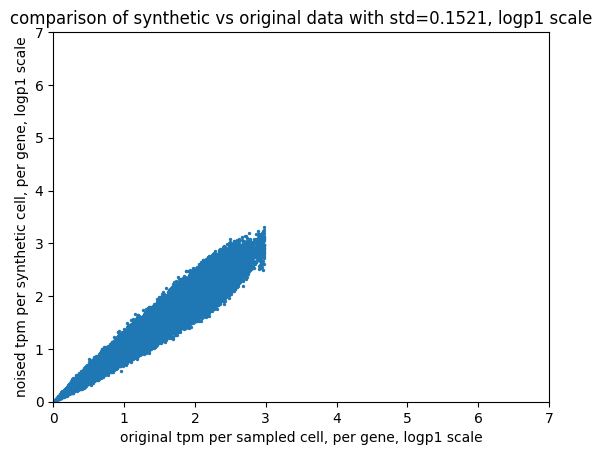

In [28]:
plt.scatter(sampled_data.data, syn_data.data, s=2)
plt.xlabel("original tpm per sampled cell, per gene, logp1 scale")
plt.ylabel("noised tpm per synthetic cell, per gene, logp1 scale")
plt.xlim(0,7)
plt.ylim(0,7)
plt.title("comparison of synthetic vs original data with std={0:.4f}, logp1 scale".format(estimated_std))

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.1521, non-log scale')

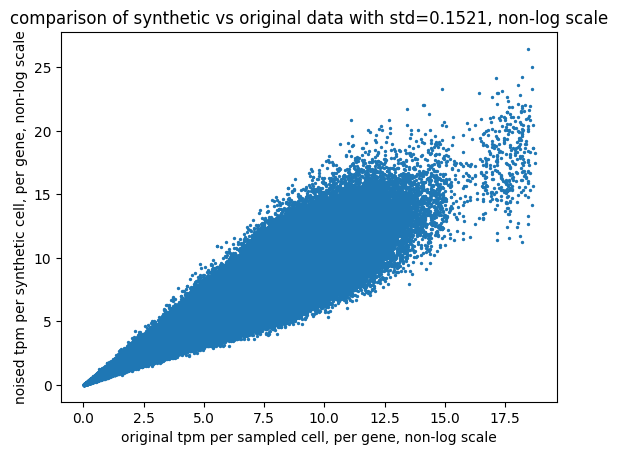

In [29]:
plt.scatter(np.expm1(sampled_data.data), np.expm1(syn_data.data), s=2)
plt.xlabel("original tpm per sampled cell, per gene, non-log scale")
plt.ylabel("noised tpm per synthetic cell, per gene, non-log scale")
plt.title("comparison of synthetic vs original data with std={0:.4f}, non-log scale".format(estimated_std))

### create full synthetic data

In [25]:
syn_data = scipy.sparse.csr_matrix((0,adata.shape[1]))
start_time = datetime.now()
print("start time: {}".format(start_time))
print("adding Gaussian noise with std {}".format(estimated_std))
for i in np.arange(len(pids)):
    #get lognorm data for pid
    this_pid_lognorm = adata[adata.obs.pid == pids[i]].layers['lognorm']
    #sample <ncells> cells
    sampled_cell_idxs = np.random.choice(this_pid_lognorm.shape[0], size=syn_ncells[i])
    sampled_data = this_pid_lognorm[sampled_cell_idxs,:]
#    print("1")

    ## add gaussian noise in log space. 
    #convert from logp1 to log, so that we have negative values before adding gaussian noise
    #limite to nnz entries or log throws error
    sampled_data.data = np.expm1(sampled_data.data)
    sampled_data.data = np.log(sampled_data.data)
#    print("2")
    
    #add noise
    this_syn_data = sampled_data.copy() #at this point, syn and sampled data both log scale (without +1)
    this_syn_data.data = sampled_data.data + np.random.normal(size=sampled_data.data.shape, scale=estimated_std)
#    print("3")

    #convert back from log space to logp1 space
    this_syn_data.data = np.exp(this_syn_data.data)
    this_syn_data.data = np.log(this_syn_data.data+1)
#    print("4")
    
    syn_data = scipy.sparse.vstack([syn_data, this_syn_data])
print("time elapsed: {}".format(datetime.now()-start_time))


start time: 2023-03-14 17:23:20.203708
adding Gaussian noise with median 0.1521066275766642
time elapsed: 0:06:16.945763


In [85]:
syn_data

<203340x18136 sparse matrix of type '<class 'numpy.float64'>'
	with 400113685 stored elements in Compressed Sparse Row format>

# put synthetic data in adata object

In [27]:
#create obs for synthetic data
full_syn_pids = pids.astype("str") + "_syn" + pd.Series(np.arange(len(pids))+1).astype("str")
syn_pids = "syn" + pd.Series(np.arange(len(pids))+1).astype("str")
syn_obs = pd.DataFrame(data={"syn_pid":syn_pids, "full_syn_pid":full_syn_pids, "pid_orig":np.repeat(pids, syn_ncells)})

#merge with clinical info
syn_obs = syn_obs.merge(adata.obs.rename(columns={'pid':'pid_orig'})[['pid_orig','response','therapy','pre_or_post']].drop_duplicates())#.set_index("pid_orig")

#update colnames in adata to say "orig" so that any new gene calculations don't overwrite
adata.var.columns = adata.var.columns + "_orig"


In [28]:
syn_adata = sc.AnnData(syn_data, var = adata.var, obs = syn_obs)

/tmp/ipykernel_37441/983919073.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  syn_adata = sc.AnnData(syn_data, var = adata.var, obs = syn_obs)
/opt/conda/rpeyser/envs/scset/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


# process and visualize syn adata

## Scanpy preprocessing

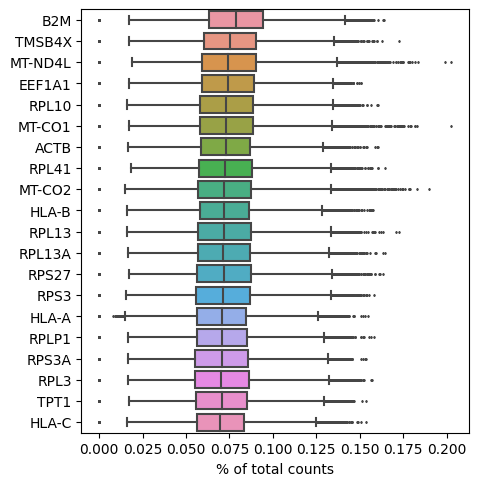

In [29]:
sc.pl.highest_expr_genes(syn_adata, n_top=20, )

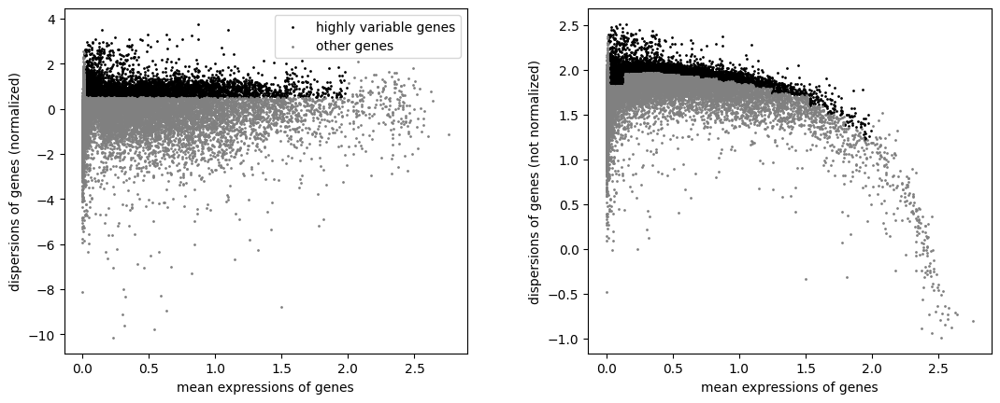

In [30]:
#sc.pp.log1p(syn_adata) already logged
sc.pp.highly_variable_genes(syn_adata, min_mean=0.0125, max_mean=2, min_disp=0.5)
sc.pl.highly_variable_genes(syn_adata)

In [31]:
#adata.raw = adata
syn_adata.layers['lognorm'] = syn_adata.X.copy()

In [32]:
start_time = datetime.now()
print("start time: {}".format(start_time))
sc.pp.scale(syn_adata, max_value=10) #also time consuming
print("time elapsed: {}".format(datetime.now()-start_time))

start time: 2023-03-14 17:29:51.715308
time elapsed: 0:00:50.923586


In [33]:
start_time = datetime.now()
print("start time: {}".format(start_time))
sc.tl.pca(syn_adata, svd_solver='arpack') #also time consuming
print("time elapsed: {}".format(datetime.now()-start_time))


start time: 2023-03-14 17:30:42.647972
time elapsed: 0:00:41.262717


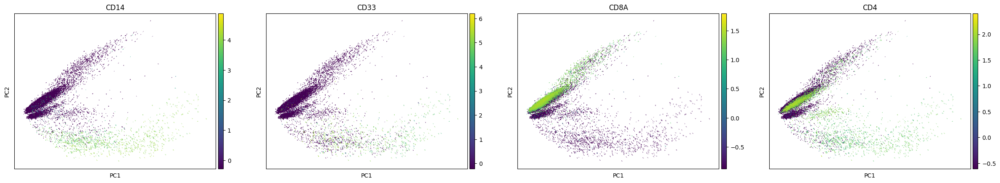

In [34]:
sc.pl.pca(syn_adata, color=['CD14','CD33','CD8A','CD4'])

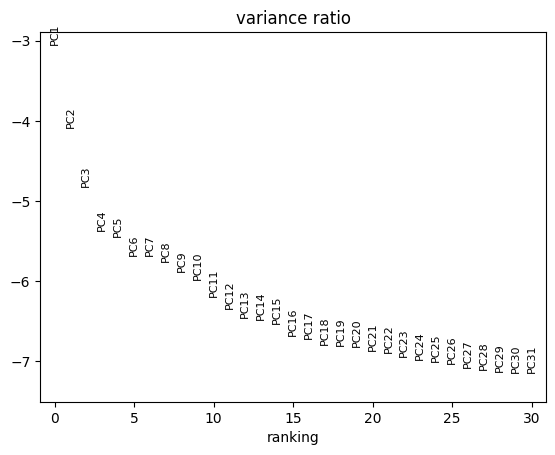

In [35]:
sc.pl.pca_variance_ratio(syn_adata, log=True)

In [36]:
start_time = datetime.now()
print("start time: {}".format(start_time))
sc.pp.neighbors(syn_adata, n_neighbors=30, n_pcs=20)
print("time elapsed: {}".format(datetime.now()-start_time))

start time: 2023-03-14 17:31:27.165944
time elapsed: 0:02:01.379479


## save synthetic adata object to disk

In [37]:
syn_adata.write("/localdata/rna_rep_learning/sadefeldman/synthetic_data/syn_adata_noised_std_{0:.4f}.h5ad".format(estimated_std))

## attempt to run UMAP

In [ ]:
#VERY TIME INTENSIVE ON FULL DATASET
start_time = datetime.now()
print("start time: {}".format(start_time))
sc.tl.umap(syn_adata)#, method='rapids')
print("time elapsed: {}".format(datetime.now()-start_time))
#finished at around 4pm on 3/14 = 18 hours total

start time: 2023-03-14 17:33:41.737749


/opt/conda/rpeyser/envs/scset/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


In [ ]:
syn_adata.write("/localdata/rna_rep_learning/sadefeldman/synthetic_data/syn_adata_noised_std_{0:.4f}.h5ad".format(estimated_std))

In [ ]:
sc.pl.umap(syn_adata, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','S100A8','CD19'], ncols=2)

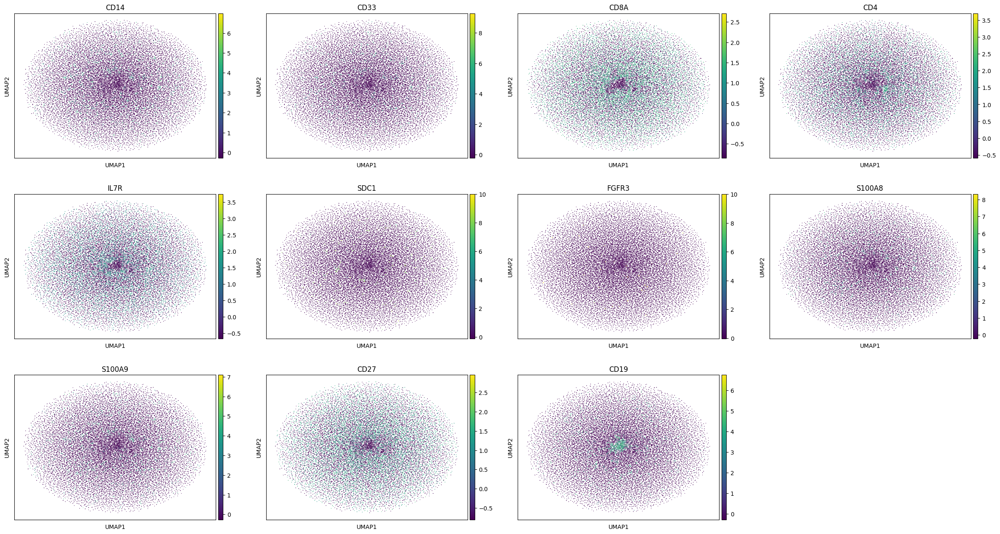

In [33]:
#results when std=0.5
sc.pl.umap(syn_adata, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


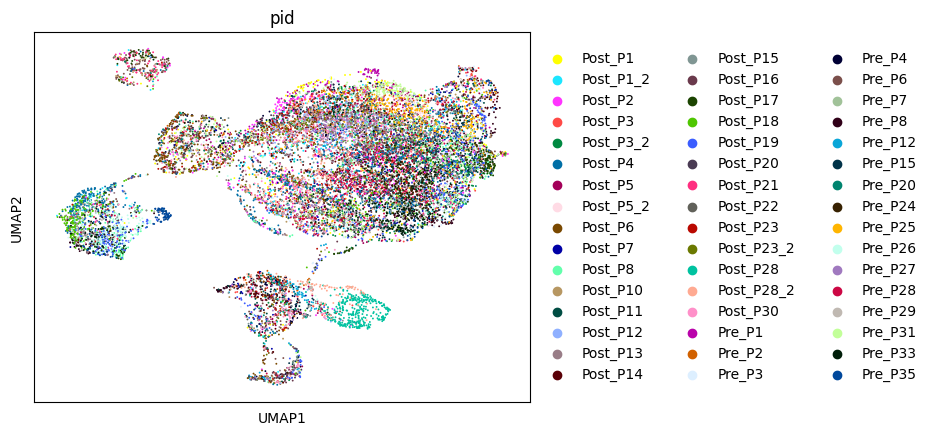

In [70]:
sc.pl.umap(syn_adata, color='pid_orig')

In [84]:
adata.var.highly_variable.sum()

5261

# pseudobulk and run UMAP (not yet run)

In [ ]:
#undo log before aggregation
to_pbulk = pd.DataFrame(np.expm1(syn_adata.layers['lognorm']).todense(), index=syn_adata.obs.index, col=syn_adata.var.index)

In [ ]:
to_pbulk = to_pbulk.merge(syn_adata.obs[["full_syn_pid"]])
to_pbulk

In [ ]:
to_pbulk = pd.melt(to_pbulk, id_vars="full_syn_pid", var_name="gene", value_name="norm_expr")
to_pbulk

# OLD PLOTS, with standard deviation for gaussian noise = 0.5

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.5, log scale')

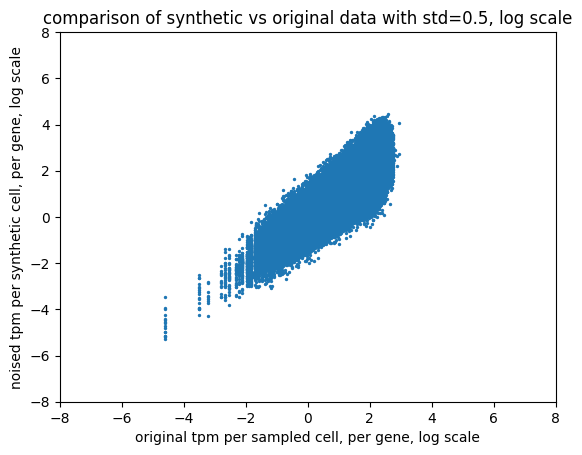

In [243]:
plt.scatter(np.log(np.expm1(sampled_data.data)), np.log(np.expm1(syn_data.data)), s=2)
plt.xlabel("original tpm per sampled cell, per gene, log scale")
plt.ylabel("noised tpm per synthetic cell, per gene, log scale")
plt.xlim(-8,8)
plt.ylim(-8,8)
plt.title("comparison of synthetic vs original data with std=0.5, log scale")

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.5, logp1 scale')

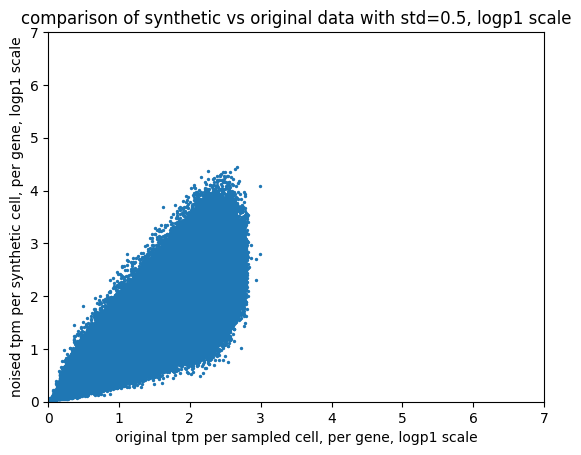

In [244]:
plt.scatter(sampled_data.data, syn_data.data, s=2)
plt.xlabel("original tpm per sampled cell, per gene, logp1 scale")
plt.ylabel("noised tpm per synthetic cell, per gene, logp1 scale")
plt.xlim(0,7)
plt.ylim(0,7)
plt.title("comparison of synthetic vs original data with std=0.5, logp1 scale")

Text(0.5, 1.0, 'comparison of synthetic vs original data with std=0.5, non-log scale')

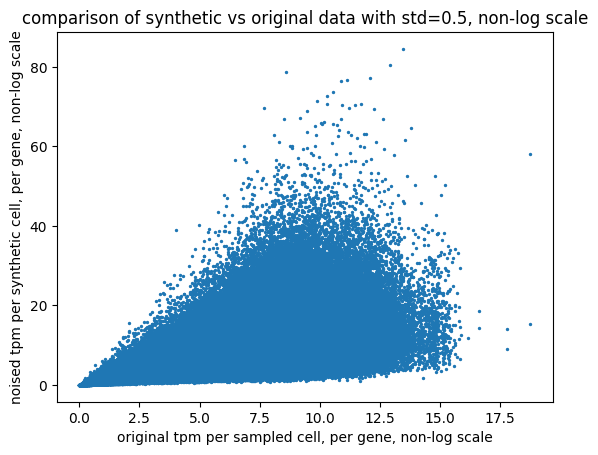

In [246]:
plt.scatter(np.expm1(sampled_data.data), np.expm1(syn_data.data), s=2)
plt.xlabel("original tpm per sampled cell, per gene, non-log scale")
plt.ylabel("noised tpm per synthetic cell, per gene, non-log scale")
plt.title("comparison of synthetic vs original data with std=0.5, non-log scale")

# BELOW IS OLD VERSION OF SYNTHETIC DATA (sampling identical cells from 4 clinical subtypes)

In [8]:
#distribution of n cells per patient
print("min", adata.obs.groupby("pid").size().min())
print("median", adata.obs.groupby("pid").size().median())
print("max", adata.obs.groupby("pid").size().max())

min 163
median 337.5
max 675


In [17]:
adata.obs.drop_duplicates("pid").groupby(["response", "pre_or_post", "therapy"]).size()

response       pre_or_post  therapy       
Non-responder  Post         anti-CTLA4         0
                            anti-CTLA4+PD1     3
                            anti-PD1          18
               Pre          anti-CTLA4         1
                            anti-CTLA4+PD1     1
                            anti-PD1           8
Responder      Post         anti-CTLA4         0
                            anti-CTLA4+PD1     3
                            anti-PD1           5
               Pre          anti-CTLA4         1
                            anti-CTLA4+PD1     4
                            anti-PD1           4
dtype: int64

In [38]:
# can sample from groups of patients but they should be homogenous in terms of:
# response (responder or non-responder)
# pre-therapy or post-therapy
# if post-therapy, then should be same therapy (actually, they don't make this distinction in the paper, so nvm)

# creating 4 types of synthetic patients: non-responder pre-therapy (nr_pre), non-responder post-therapy (nr_post; grouping together anti-PD1 and anti-CTLA4+PD1), responder pre-therapy (r_pre), responder post-therapy (r_post; grouping together anti-PD1 and anti-CTLA4+PD1)

n_synthetic = 150 #n synthetic examples to create for each group
n_cells_per_sample = 350 #n cells per synthetic example

nr_pre_idx = np.random.choice(adata[(adata.obs.response == "Non-responder") & (adata.obs.pre_or_post == "Pre")].shape[0], size=n_synthetic*n_cells_per_sample, replace=True)
nr_pre_adata = adata[(adata.obs.response == "Non-responder") & (adata.obs.pre_or_post == "Pre")][nr_pre_idx]

nr_post_idx = np.random.choice(adata[(adata.obs.response == "Non-responder") & (adata.obs.pre_or_post == "Post")].shape[0], size=n_synthetic*n_cells_per_sample, replace=True)
nr_post_adata = adata[(adata.obs.response == "Non-responder") & (adata.obs.pre_or_post == "Post")][nr_post_idx]

r_pre_idx = np.random.choice(adata[(adata.obs.response == "Responder") & (adata.obs.pre_or_post == "Pre")].shape[0], size=n_synthetic*n_cells_per_sample, replace=True)
r_pre_adata = adata[(adata.obs.response == "Responder") & (adata.obs.pre_or_post == "Pre")][r_pre_idx]

r_post_idx = np.random.choice(adata[(adata.obs.response == "Responder") & (adata.obs.pre_or_post == "Post")].shape[0], size=n_synthetic*n_cells_per_sample, replace=True)
r_post_adata = adata[(adata.obs.response == "Responder") & (adata.obs.pre_or_post == "Post")][r_post_idx]

In [39]:
synthetic_adata = nr_pre_adata.concatenate([nr_post_adata, r_pre_adata, r_post_adata], batch_key='synthetic_cat', batch_categories=['nr_pre_adata','nr_post_adata','r_pre_adata','r_post_adata'])

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. 

In [40]:
#artifically assign patient ids to cells (total of 600 patients)
synthetic_adata.obs['synthetic_pid'] = np.repeat(np.arange(n_synthetic*4)+1, n_cells_per_sample)

In [47]:
# save synthetic adata
synthetic_adata.write("/localdata/rna_rep_learning/sadefeldman/synthetic_data/synthetic_adata.h5ad")

FileNotFoundError: [Errno 2] Unable to create file (unable to open file: name = '/data/rna_rep_learning/sadefeldman/synthetic_data/synthetic_adata.h5ad', errno = 2, error message = 'No such file or directory', flags = 13, o_flags = 242)

In [82]:
synthetic_adata = sc.read("/data/rna_rep_learning/sadefeldman/synthetic_data/synthetic_adata.h5ad")

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# visualize synthetic adata

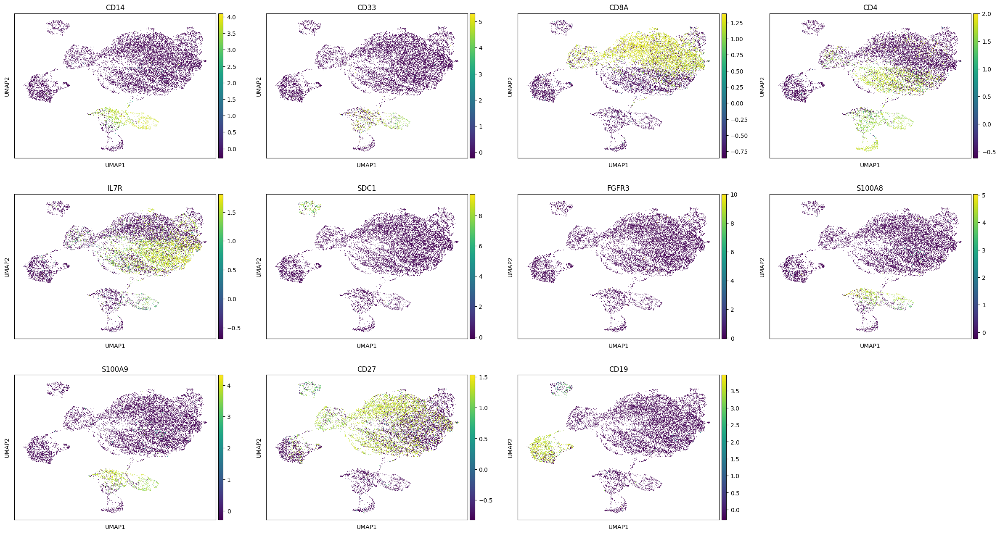

In [83]:
sc.pl.umap(synthetic_adata, color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

In [ ]:
#add PCs to obs in order to color by them
synthetic_adata.obs = pd.concat([synthetic_adata.obs, pd.DataFrame(synthetic_adata.obsm['X_pca'][:,:20], columns=["PC"+str(i) for i in range(1,21)], index=synthetic_adata.obs.index)], axis=1)

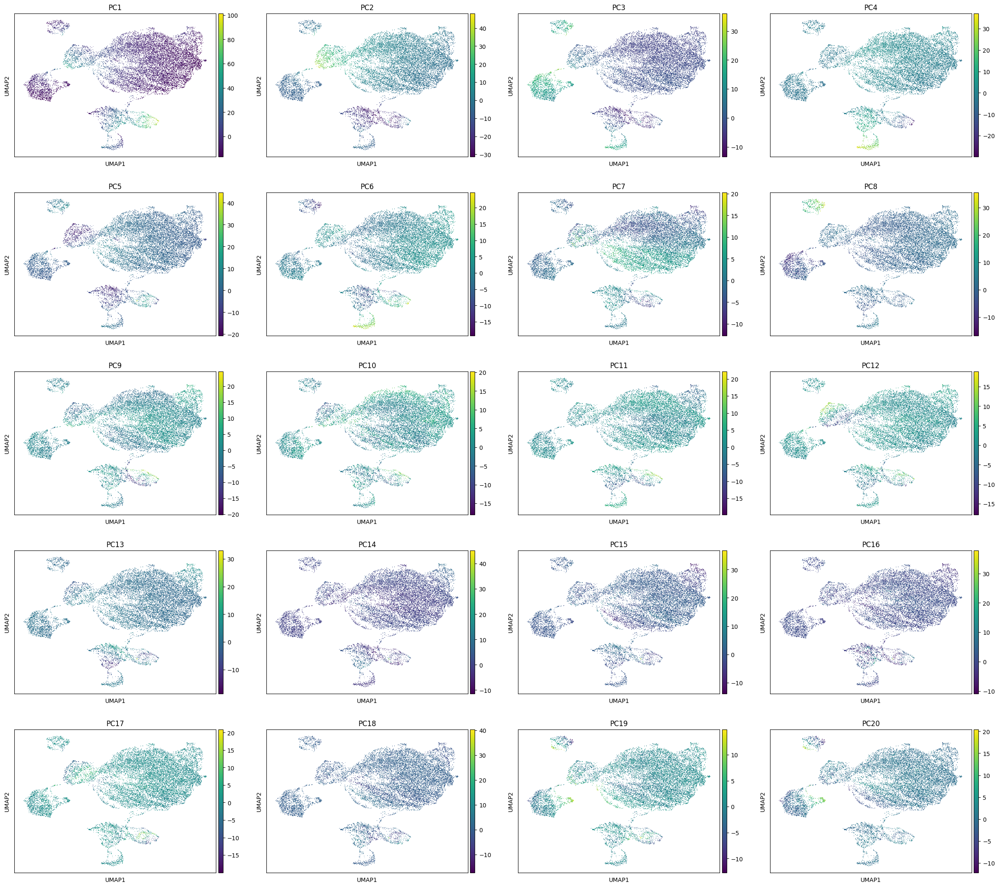

In [26]:
sc.pl.umap(synthetic_adata, color=["PC"+str(i) for i in range(1,21)])

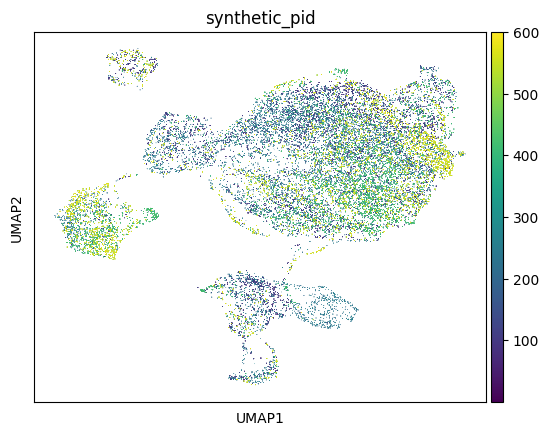

In [46]:
sc.pl.umap(synthetic_adata, color='synthetic_pid')

/opt/conda/rpeyser/envs/scset3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


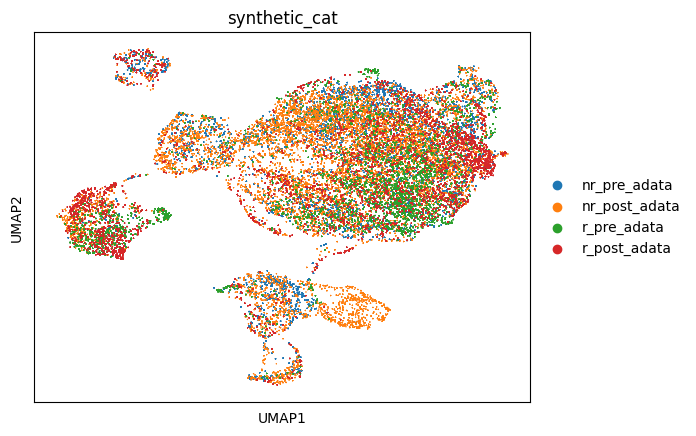

In [50]:
sc.pl.umap(synthetic_adata, color='synthetic_cat', size=3)

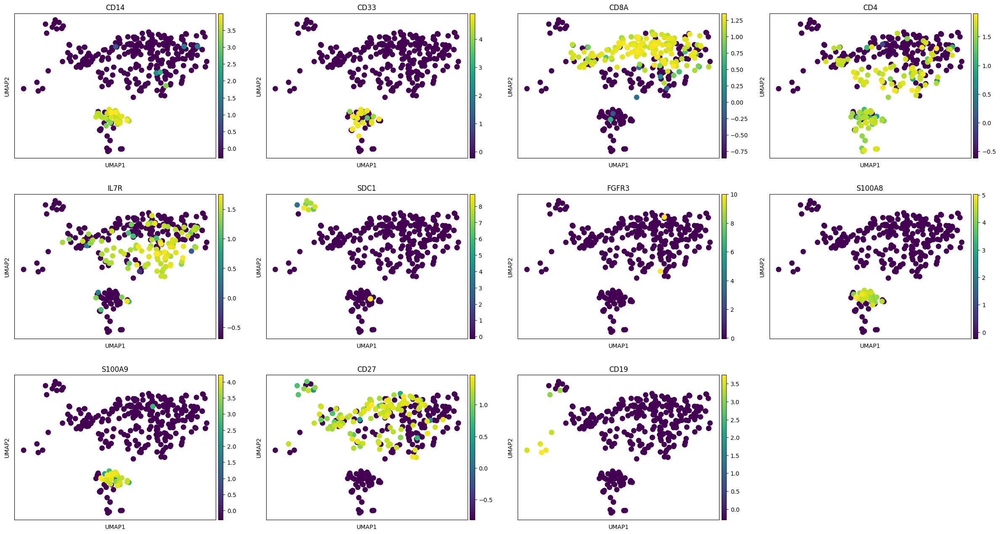

In [51]:
#viz one patient (what we will try to reconstruct)
sc.pl.umap(synthetic_adata[synthetic_adata.obs.synthetic_pid == 1], color=['CD14','CD33','CD8A','CD4','IL7R','SDC1','FGFR3','S100A8','S100A9','CD27','CD19'])

In [84]:
adata.var.highly_variable.sum()

5261